# Cox Proportional Hazards Estimator for Analyzing Programming Language Survival on GitHub

---



## Introduction
This notebook provides a comprehensive analysis using the Cox Proportional Hazards (CoxPH) model. The CoxPH model is a statistical technique used in survival analysis to explore the association between the survival time of patients and one or more predictor variables. In this analysis, we apply the CoxPH model to a dataset containing information about various GitHub repositories, with the goal of understanding how different features influence their survival times.

## Objective
The primary objective of this tutorial is to understand how to use the Cox Proportional Hazards (CoxPH) model to analyze the impact of various features on the longevity and retention of GitHub repositories. By the end of this notebook, you will be able to:

* **Load and Preprocess Data**:
   - Import and clean the GitHub repository dataset.
   - Prepare the data by handling datetime columns, encoding categorical variables, and dealing with missing values.
* **Fit the Cox Proportional Hazards Model**:
   - Apply the CoxPH model to analyze the relationship between repository features and survival time.
* **Evaluate Model Assumptions**:
   - Check the proportional hazards assumption and the linearity of continuous covariates to ensure the validity of the CoxPH model.
* **Interpret Model Results**:
   - Review and interpret the model's coefficients and their impact on the survival times of GitHub repositories.
* **Visualize Results**:
   - Create visualizations to effectively communicate the findings from the CoxPH model and the estimated hazard ratios.

## Prerequisites
To follow this notebook, you should have a basic understanding of Python programming and familiarity with data analysis libraries such as Pandas, NumPy, and Matplotlib. Additionally, you should have the Lifelines library installed for survival analysis.

## Notebook Outline
1. **Data Loading**:
    - Load the dataset from a specified file path.
    - Handle any errors related to file loading, such as missing files or empty content.

2. **Data Preparation for CoxPH Estimator**:
    - Select relevant columns for the CoxPH model.
    - Convert date columns to datetime format and make them timezone-naive.
    - Transform datetime columns into numeric values (seconds since a reference date).
    - Convert boolean columns to integers.
    - Perform one-hot encoding on categorical columns.
    - Handle missing values to ensure data integrity.

3. **Model Fitting and Evaluation**:
    - Fit the Cox Proportional Hazards model using the prepared data.
    - Print the summary of the model to review the results.
    - Create interactive visualizations using Plotly to visualize the CoxPH model's coefficients and their effects.

4. **Model Assumptions Check**:
    - Assess the proportional hazards assumption and the linearity of continuous covariates.
    - Interpret the results of the assumptions check to validate the model.
---


## Import libraries

In [38]:
%%capture
!pip install lifelines
!pip install plotly

In [39]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from lifelines import CoxPHFitter
import os
import plotly.express as px
import plotly.graph_objects as go

## Data Loading

In [40]:
# Load the data
data_path = os.getenv('DATA_PATH', '/content/processed_languages_frameworks.csv')

try:
    data = pd.read_csv(data_path)
except FileNotFoundError:
    print("Error: File not found. Please check the file path.")
    raise
except pd.errors.EmptyDataError:
    print("Error: The file is empty. Please check the file content.")
    raise
except Exception as e:
    print(f"An error occurred: {e}")
    raise

In [41]:
data

,name,full_name,description,search_key,language,key_words,stars,forks,watchers,open_issues,created_at,updated_at,pushed_at,releases,survival_time,time_since_last_push,event
0,system-design-primer,donnemartin/system-design-primer,Learn how to design large-scale systems. Prep ...,Python,Python,"['design', 'design-patterns', 'design-system',...",264072,44767,264072,435,2017-02-26 16:15:28+00:00,2024-07-12 16:47:58+00:00,2024-06-29 00:09:30+00:00,0,2679,16,0
1,awesome-python,vinta/awesome-python,An opinionated list of awesome Python framewor...,Python,Python,"['awesome', 'collections', 'python', 'python-f...",212323,24654,212323,416,2014-06-27 21:00:06+00:00,2024-07-12 16:45:14+00:00,2024-07-08 23:26:43+00:00,0,3664,6,0
2,tensorflow,tensorflow/tensorflow,An Open Source Machine Learning Framework for ...,Python,C++,"['deep-learning', 'deep-neural-networks', 'dis...",184034,74063,184034,3727,2015-11-07 01:19:20+00:00,2024-07-12 16:44:43+00:00,2024-07-12 16:47:04+00:00,30,3170,3,0
3,Python,TheAlgorithms/Python,All Algorithms implemented in Python,Python,Python,"['algorithm', 'algorithm-competitions', 'algor...",182120,44004,182120,229,2016-07-16 09:44:01+00:00,2024-07-12 16:26:11+00:00,2024-07-12 16:25:12+00:00,0,2918,3,0
4,project-based-learning,practical-tutorials/project-based-learning,Curated list of project-based tutorials,Python,Python,"['beginner-project', 'cpp', 'golang', 'javascr...",181910,23897,181910,148,2017-04-12 05:07:46+00:00,2024-07-12 16:38:09+00:00,2024-07-10 18:02:06+00:00,0,2646,5,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9973,bpmn-js-example-model-extension,bpmn-io/bpmn-js-example-model-extension,An example of creating a model extension for b...,Ext-JS,JavaScript,['bpmn-js'],27,14,27,0,2019-03-27 08:47:30+00:00,2024-03-12 12:57:10+00:00,2019-04-08 10:57:11+00:00,0,12,1925,1
9974,OS.js-extras,os-js/OS.js-extras,OS.js (v2) - Extra Packages,Ext-JS,JavaScript,[],26,20,26,1,2013-12-02 21:56:08+00:00,2024-01-25 18:35:17+00:00,2017-12-15 18:38:00+00:00,0,1473,2404,1
9975,jsonschema-extractor,toumorokoshi/jsonschema-extractor,Extract jsonschema from various Python objects,Ext-JS,Python,[],26,9,26,2,2017-06-20 03:32:28+00:00,2024-02-23 12:47:24+00:00,2022-10-25 05:09:49+00:00,0,1953,629,1
9976,extractor-js,rsdoiel/extractor-js,Since I originally wrote this a module called ...,Ext-JS,Ext-JS,[],26,4,26,0,2011-08-15 18:08:30+00:00,2023-01-28 13:26:17+00:00,2015-11-16 20:02:44+00:00,0,1554,3164,1


## Data Preparation for CoxPH Estimator

In [42]:
# Select relevant columns for the Cox model
relevant_columns = [
    'stars', 'forks', 'watchers', 'open_issues',
    'created_at', 'updated_at', 'pushed_at', 'releases',
    'survival_time', 'time_since_last_push', 'event', 'language'
]
cox_data = data[relevant_columns]

In [43]:
# Convert date columns to datetime
cox_data['created_at'] = pd.to_datetime(cox_data['created_at'], errors='coerce')
cox_data['updated_at'] = pd.to_datetime(cox_data['updated_at'], errors='coerce')
cox_data['pushed_at'] = pd.to_datetime(cox_data['pushed_at'], errors='coerce')

<ipython-input-43-e0c530e9a449>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-43-e0c530e9a449>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-43-e0c530e9a449>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [44]:
# Convert datetime columns to timezone-naive
cox_data['created_at'] = cox_data['created_at'].dt.tz_localize(None)
cox_data['updated_at'] = cox_data['updated_at'].dt.tz_localize(None)
cox_data['pushed_at'] = cox_data['pushed_at'].dt.tz_localize(None)

<ipython-input-44-053bf46f3fd0>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-44-053bf46f3fd0>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-44-053bf46f3fd0>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [45]:
# Convert datetime columns to numeric (e.g., timestamp or duration since a reference date)
reference_date = pd.Timestamp('1970-01-01')
cox_data['created_at'] = (cox_data['created_at'] - reference_date).dt.total_seconds()
cox_data['updated_at'] = (cox_data['updated_at'] - reference_date).dt.total_seconds()
cox_data['pushed_at'] = (cox_data['pushed_at'] - reference_date).dt.total_seconds()

<ipython-input-45-d962f8a03905>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-45-d962f8a03905>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-45-d962f8a03905>:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [46]:
# Convert boolean columns to integers
bool_columns = cox_data.select_dtypes(include=[bool]).columns
cox_data[bool_columns] = cox_data[bool_columns].astype(int)

In [47]:
# One-hot encode the 'name' column
cox_data = pd.get_dummies(cox_data, columns=['language'], drop_first=True)

In [48]:
# Check for and handle missing values
cox_data = cox_data.dropna()

In [49]:
cox_data.dtypes

stars                int64
forks                int64
watchers             int64
open_issues          int64
created_at         float64
                    ...   
language_Vuejs        bool
language_Wicket       bool
language_Zope         bool
language_dBASE        bool
language_jQuery       bool
Length: 109, dtype: object

In [50]:
cox_data.head()

,stars,forks,watchers,open_issues,created_at,updated_at,pushed_at,releases,survival_time,time_since_last_push,...,language_Tapestry,language_TensorFlow,language_TurboGears,language_TypeScript,language_VB6,language_Vuejs,language_Wicket,language_Zope,language_dBASE,language_jQuery
0,264072,44767,264072,435,1.488126e+09,1.720803e+09,1.719620e+09,0,2679,16,...,False,False,False,False,False,False,False,False,False,False
1,212323,24654,212323,416,1.403903e+09,1.720803e+09,1.720481e+09,0,3664,6,...,False,False,False,False,False,False,False,False,False,False
2,184034,74063,184034,3727,1.446859e+09,1.720803e+09,1.720803e+09,30,3170,3,...,False,False,False,False,False,False,False,False,False,False
3,182120,44004,182120,229,1.468662e+09,1.720802e+09,1.720802e+09,0,2918,3,...,False,False,False,False,False,False,False,False,False,False
4,181910,23897,181910,148,1.491974e+09,1.720802e+09,1.720635e+09,0,2646,5,...,False,False,False,False,False,False,False,False,False,False


## Model Fitting and Evaluation

In [51]:
# Example: Create a binary column indicating whether the repository is in a specific group
# Let's assume you want to compare two languages: Python and JavaScript
cox_data['group'] = (cox_data['language_Python'] == 1).astype(int)  # 1 if Python, 0 otherwise

In [52]:
# Fit the Cox proportional hazards model
cph = CoxPHFitter(penalizer=0.1)
cph.fit(cox_data, duration_col='survival_time', event_col='event')

<lifelines.CoxPHFitter: fitted with 9978 total observations, 6258 right-censored observations>

In [53]:
# Print the summary of the model
cph.print_summary()

<lifelines.CoxPHFitter: fitted with 9978 total observations, 6258 right-censored observations>
             duration col = 'survival_time'
                event col = 'event'
                penalizer = 0.1
                 l1 ratio = 0.0
      baseline estimation = breslow
   number of observations = 9978
number of events observed = 3720
   partial log-likelihood = -27251.28
         time fit was run = 2024-07-19 20:12:30 UTC

---
                                         coef exp(coef)  se(coef)  coef lower 95%  coef upper 95% exp(coef) lower 95% exp(coef) upper 95%
covariate                                                                                                                                
stars                                   -0.00      1.00      0.00           -0.00           -0.00                1.00                1.00
forks                                   -0.00      1.00      0.00           -0.00           -0.00                1.00                1.00
watchers                                -0.00      1.00      0.00           -0.00           -0.00                1.00                1.00
open_issues                             -0.00      1.00      0.00           -0.00           -0.00                1.00                1.00
created_at                               0.00      1.00      0.00            0.00            0.00                1.00                1.00
updated_at                              -0.00      1.00      0.00           -0.00           -0.00                1.00                1.00
pushed_at                               -0.00      1.00      0.00           -0.00           -0.00                1.00                1.00
releases                                -0.03      0.97      0.00           -0.03           -0.03                0.97                0.97
time_since_last_push                     0.00      1.00      0.00            0.00            0.00                1.00                1.00
language_APL                            -0.07      0.94      0.28           -0.61            0.48                0.55                1.61
language_ASP                             0.02      1.02      0.37           -0.72            0.75                0.49                2.12
language_ASP-NET                        -0.04      0.96      0.40           -0.83            0.75                0.43                2.13
language_AWT                             0.77      2.16      0.33            0.12            1.42                1.13                4.13
language_Ada                            -0.11      0.90      0.31           -0.72            0.50                0.49                1.65
language_Angular                         0.06      1.07      0.37           -0.67            0.80                0.51                2.22
language_Assembly Language               0.56      1.75      0.17            0.23            0.89                1.26                2.45
language_BASIC                          -0.17      0.85      0.34           -0.83            0.50                0.44                1.64
language_Bootstrap                      -0.01      0.99      0.24           -0.47            0.45                0.62                1.57
language_C                               0.08      1.08      0.09           -0.11            0.26                0.90                1.30
language_C#                              0.02      1.02      0.08           -0.13            0.18                0.88                1.19
language_C++                             0.21      1.23      0.08            0.05            0.37                1.05                1.44
language_CLIPPER                         0.80      2.22      0.30            0.21            1.38                1.23                3.98
language_COBOL                           0.68      1.97      0.16            0.37            0.99                1.45                2.69
language_CORBA                          -0.27      0.76      0.35           -0.95            0.41                0

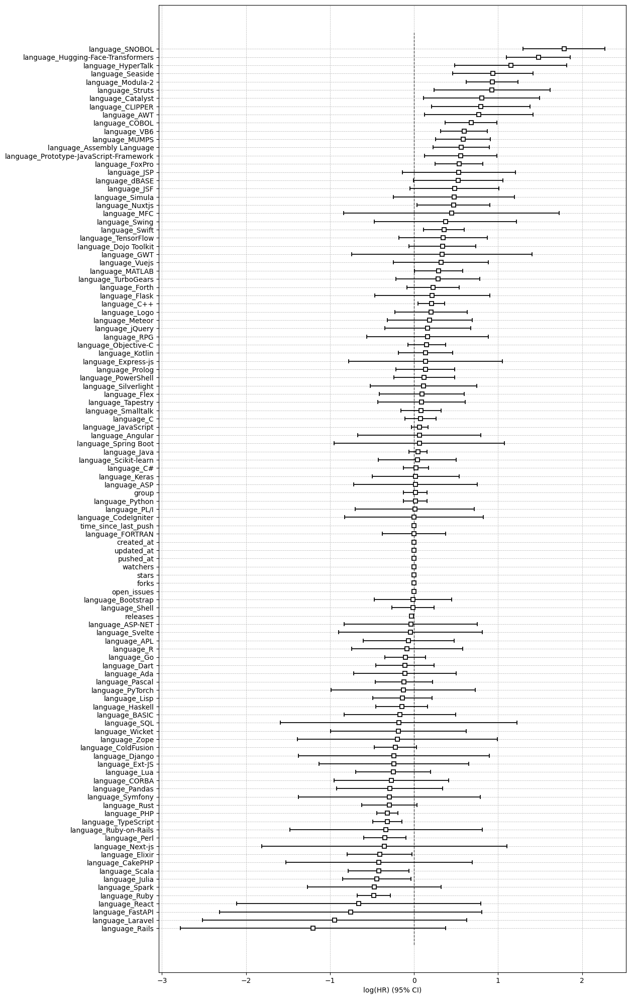

In [54]:
# Plot CoxPH summary
plt.figure(figsize=(12, 25))
cph.plot()
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.show()

In [55]:
# Prepare data for Plotly
coefficients = cph.summary[['exp(coef)', 'coef', 'se(coef)', 'p']]
coefficients.reset_index(inplace=True)
coefficients.columns = ['Feature', 'Exponentiated Coefficients', 'Coefficients', 'Standard Error', 'p-value']

In [56]:
# Create Plotly bar plot for coefficients
fig = px.bar(coefficients, x='Feature', y='Coefficients', title='Cox Model Coefficients',
             labels={'Coefficients': 'Coefficient Value'},
             text='Coefficients')

fig.update_traces(texttemplate='%{text:.2f}', textposition='outside')
fig.update_layout(uniformtext_minsize=12, uniformtext_mode='hide')
fig.show()

## Model Assumptions Check

In [57]:
# Extracting the relevant information
summary = cph.summary
group_test = summary.loc['group', ['coef', 'exp(coef)', 'p']]
print("Group Variable Test:")
print(f"Coefficient: {group_test['coef']}")
print(f"Exponentiated Coefficient (Hazard Ratio): {group_test['exp(coef)']}")
print(f"P-value: {group_test['p']}")

Group Variable Test:
Coefficient: 0.01533851846191668
Exponentiated Coefficient (Hazard Ratio): 1.0154567572989013
P-value: 0.8327588188992027


In [58]:
# Check the proportional hazards assumption for the Cox model
cph.check_assumptions(cox_data, p_value_threshold=0.05)

The ``p_value_threshold`` is set at 0.05. Even under the null hypothesis of no violations, some
covariates will be below the threshold by chance. This is compounded when there are many covariates.
Similarly, when there are lots of observations, even minor deviances from the proportional hazard
assumption will be flagged.

With that in mind, it's best to use a combination of statistical tests and visual tests to determine
the most serious violations. Produce visual plots using ``check_assumptions(..., show_plots=True)``
and looking for non-constant lines. See link [A] below for a full example.



<lifelines.StatisticalResult: proportional_hazard_test>
 null_distribution = chi squared
degrees_of_freedom = 1
             model = <lifelines.CoxPHFitter: fitted with 9978 total observations, 6258 right-censored observations>
         test_name = proportional_hazard_test

---
                                              test_statistic      p  -log2(p)
created_at                              km             32.81 <0.005     26.55
                                        rank           26.82 <0.005     22.10
forks                                   km              0.23   0.63      0.66
                                        rank            0.23   0.63      0.66
group                                   km              1.06   0.30      1.72
                                        rank            0.80   0.37      1.43
language_APL                            km              0.19   0.67      0.59
                                        rank            0.22   0.64      0.64
language_ASP                            km              0.22   0.64      0.64
                                        rank            0.29   0.59      0.76
language_ASP-NET                        km              0.07   0.78      0.35
                                        rank            0.10   0.75      0.42
language_AWT                            km              0.02   0.89      0.17
                                        rank            0.03   0.86      0.22
language_Ada                            km              0.61   0.44      1.20
                                        rank            0.43   0.51      0.96
language_Angular                        km              1.26   0.26      1.94
                                        rank            1.37   0.24      2.05
language_Assembly Language              km              2.03   0.15      2.70
                                        rank            2.89   0.09      3.49
language_BASIC                          km              0.35   0.55      0.85
                                        rank            0.31   0.58      0.79
language_Bootstrap                      km              1.02   0.31      1.67
                                        rank            0.93   0.34      1.57
language_C                              km              6.68   0.01      6.68
                                        rank            6.72   0.01      6.71
language_C#                             km              0.00   0.99      0.02
                                        rank            0.00   0.99      0.01
language_C++                            km              9.26 <0.005      8.74
                                        rank            9.03 <0.005      8.56
language_CLIPPER                        km              0.21   0.65      0.63
                                        rank            0.06   0.80      0.31
language_COBOL                          km              1.54   0.21      2.22
                                        rank            2.03   0.15      2.70
language_CORBA                          km              0.09   0.76      0.40
                                        rank            0.11   0.74      0.43
language_CakePHP                        km              0.43   0.51      0.97
                                        rank            0.21   0.65      0.63
language_Catalyst                       km              0.35   0.56      0.85
                                        rank            0.61   0.44      1.20
language_CodeIgniter                    km              0.47   0.49      1.02
                                        rank            0.32   0.57      0.80
language_ColdFusion                     km              4.32   0.04      4.73
                                        rank            4.09   0.04      4.54
language_Dart                           km              0.40   0.53      0.92
                                        rank            0.31   0.58      0.79
language_Django                         km             



1. Variable 'created_at' failed the non-proportional test: p-value is <5e-05.

   Advice 1: the functional form of the variable 'created_at' might be incorrect. That is, there may
be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'created_at' using pd.cut, and then specify it in
`strata=['created_at', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


2. Variable 'updated_at' failed the non-proportional test: p-value is 0.0087.

   Advice 1: the functional form of the variable 'updated_at' might be incorrect. That is, there may
be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify 

[]

## Visualization of the model for each language

In [68]:
# Create a dropdown for selecting a language and plot the survival curve
import plotly.graph_objects as go
import ipywidgets as widgets
from IPython.display import display

# Get unique language columns
language_columns = [col for col in cox_data.columns if col.startswith('language_')]
languages = [col.replace('language_', '') for col in language_columns]

# Create a figure
fig = go.Figure()

# Add survival curves for each language (initially hidden)
for language in languages:
    language_col = f'language_{language}'
    subset = cox_data[cox_data[language_col]]
    survival_func = cph.predict_survival_function(subset)

    fig.add_trace(go.Scatter(
        x=survival_func.index,
        y=survival_func.values[:, 0],
        mode='lines',
        name=language,
        visible=False  # Initially hidden
    ))

# Make the first language visible by default
fig.data[0].visible = True

# Update layout with dropdown and fixed y-axis range
fig.update_layout(
    title='Cox Proportional Hazards Model Survival Function by Programming Language',
    xaxis_title='Time',
    yaxis_title='Survival Probability',
    yaxis=dict(range=[0, 1]),
    updatemenus=[{
        'buttons': [
            {
                'label': language,
                'method': 'update',
                'args': [
                    {'visible': [i == j for i in range(len(languages))]},
                    {'title': f'Cox Proportional Hazards Model Survival Function - {language}'}
                ]
            } for j, language in enumerate(languages)
        ],
        'direction': 'down',
        'showactive': True,
    }]

)


# Get overall x-axis range
overall_x_range = [data['survival_time'].min(), data['survival_time'].max()]

# Add a red horizontal line at y=0.25
fig.add_shape(
        type='line',
        x0=overall_x_range[0],
        x1=overall_x_range[1],  # Stretch across the overall x-axis range
        y0=0.25,
        y1=0.25,
        line=dict(color='Red', width=2, dash='dash'),
    )

# Display the figure
fig.show()


In [64]:
# save model .pkl
import pickle
with open('cox_model.pkl', 'wb') as f:
    pickle.dump(cph, f)